In [234]:
import numpy as np
import pandas as pd
import xarray as xr
import seaborn as sns
import cartopy.crs as crs
import cartopy.feature as cfeature
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

In [235]:
NOAA = xr.open_dataset(r'D:\CRI_Modelling_PC\Netcdf Data\NOAA\sst.day.mean.PacCst.1981-2019.nc')
bathymetry = xr.open_dataset(r'D:\CRI_Modelling_PC\Bathymetry\crm.nc')

# BCC_CSM_BS = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\BCC-CSM_TEMPS\BS\BCC-CSM_BS_1966-2005_day_tg.nc")
# BCC_CSM_RCP = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\BCC-CSM_TEMPS\RCP\BCC-CSM_RCP_2011-2050_day_tg.nc")

# ACCESS_BS = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\ACCESS_TEMPS\BS\ACCESS_BS_1966-2005_day_tg.nc")
# ACCESS_RCP = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\ACCESS_TEMPS\RCP\ACCESS_RCP_2011-2050_day_tg.nc")

# CCSM4_BS = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\CCSM4_TEMPS\BS\CCSM4_BS_1966-2005_day_tg.nc")
# CCSM4_RCP = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\CCSM4_TEMPS\RCP\CCSM4_RCP_2011-2050_day_tg.nc")

# CMCC_BS = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\CMCC_TEMPS\BS\CMCC_BS_1966-2005_day_tg.nc")
# CMCC_RCP = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\CMCC_TEMPS\RCP\CMCC_RCP_2011-2050_day_tg.nc")

# FGOALS_BS = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\FGOALS_TEMPS\BS\FGOALS_BS_1966-2005_day_tg.nc")
# FGOALS_RCP = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\FGOALS_TEMPS\RCP\FGOALS_RCP_2011-2050_day_tg.nc")

# GFDL_BS = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\GFDL_TEMPS\BS\GFDL_BS_1966-2005_day_tg.nc")
# GFDL_RCP = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\GFDL_TEMPS\RCP\GFDL_RCP_2011-2050_day_tg.nc")

# IPSL_BS = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\IPSL_TEMPS\BS\IPSL_BS_1966-2005_day_tg.nc")
# IPSL_RCP = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\IPSL_TEMPS\RCP\IPSL_RCP_2011-2050_day_tg.nc")

# MIROC5_BS = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\MIROC5_TEMPS\BS\MIROC5_BS_1966-2005_day_tg.nc")
# MIROC5_RCP = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\MIROC5_TEMPS\RCP\MIROC5_RCP_2011-2050_day_tg.nc")

# MPI_BS = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\MPI_TEMPS\BS\MPI_BS_1966-2005_day_tg.nc")
# MPI_RCP = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\MPI_TEMPS\RCP\MPI_RCP_2011-2050_day_tg.nc")

# MRI_BS = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\MRI_TEMPS\BS\MRI_BS_1966-2005_day_tg.nc")
# MRI_RCP = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\MRI_TEMPS\RCP\MRI_RCP_2011-2050_day_tg.nc")

# NorESM_BS = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\NorESM_TEMPS\BS\NorESM_BS_1966-2005_day_tg.nc")
# NorESM_RCP = xr.open_dataset(r"D:\CRI_Modelling_PC\Netcdf Data\RegCM\NorESM_TEMPS\RCP\NorESM_RCP_2011-2050_day_tg.nc")

# LandMask = xr.open_dataset(r'D:\CRI_Modelling_PC\Netcdf Data\mask_new.nc').mask

In [236]:
# NAME_list = ["ACCESS", "BCC_CSM", "CCSM4", "CMCC", "FGOALS", "MIROC5", "MRI", "NorESM", "GFDL", "IPSL", "MIROC5"]
# BS_list = [ACCESS_BS, BCC_CSM_BS, CCSM4_BS, CMCC_BS, FGOALS_BS, MIROC5_BS, MRI_BS, NorESM_BS, GFDL_BS, IPSL_BS, MIROC5_BS]
# RCP_list = [ACCESS_RCP, BCC_CSM_RCP, CCSM4_RCP, CMCC_RCP, FGOALS_RCP, MIROC5_RCP, MRI_RCP, NorESM_RCP, GFDL_RCP, IPSL_RCP, MIROC5_RCP]

In [237]:
finalBath = bathymetry.Band1

In [238]:
lat = NOAA.lat.data
lon = NOAA.lon.data
bathLat = finalBath.lat.data
bathLon = finalBath.lon.data

In [260]:
# Put in your temperature ranges here:
# All temperatures in Celcius
min_Temp = 15
max_Temp = 23
max_variance = 0.5

In [8]:
# average_BS_dict = {}
# for model in range(len(BS_list)):
#     average_BS_dict[model] = BS_list[model].tg.mean(dim='time').where(LandMask==0)

# average_RCP_dict = {}
# for model in range(len(RCP_list)):
#     average_RCP_dict[model] = RCP_list[model].tg.mean(dim='time').where(LandMask==0)

In [9]:
# NOAA_years = np.where((pd.DatetimeIndex(NOAA.time.data).year==curYear))
# NOAA_short = NOAA.sst[(NOAA_years[0]),:,:]
    
#NOAA_Mask  = NOAA.sst.where(NOAA.sst.isnull(), 1)
# NOAA_Count = NOAA_short.where((NOAA_short <= max_Temp) & (NOAA_short >= min_Temp)).groupby('time.year')
# NOAA_Count = NOAA_short.where((NOAA_short <= max_Temp) & (NOAA_short >= min_Temp)).groupby('time.year').count(dim='time')
# NOAA_Count = NOAA_short.groupby('time.year').count(dim='time')
# count_Mean = NOAA_Count.mean(dim="year")
# NOAA_Final = count_Mean*NOAA_Mask[0,:,:]
#NOAA_temps = NOAA_short.mean('time')
# for lat in NOAA_temps:
#     for temp in lat:
#         print(temp.data)
# for readings in range(len(NOAA_temps.data)):
#     for temp in NOAA_temps.data[readings]:
#         if temp > 25:
#             temp = 0
# NOAA_temps = NOAA_temps.where(NOAA_temps.isnull(), 1)
# for values in range(len(NOAA_temps.data)):
#     for temp in range(len(NOAA_temps.data[values])):
#         NOAA_temps.data[values][temp] = NOAA_temps.data[values][temp] if ((NOAA_temps.data[values][temp] > 27 and NOAA_temps.data[values][temp] < 33) or (NOAA_temps.data[values][temp] > 7 and NOAA_temps.data[values][temp] < 13)) else max_Temp/2
                    
# #NOAA_temps *= NOAA_Mask[0,:,:]
# NOAA_temps

NOAA_years = np.where((pd.DatetimeIndex(NOAA.time.data).year==2000))
NOAA_short = NOAA.sst[(NOAA_years[0]),:,:]
NOAA_temps = NOAA_short.mean('time')
#NOAA_temps = NOAA_temps.where(NOAA_temps.isnull(), 1)
for values in range(len(NOAA_temps.data)):
    for temp in range(len(NOAA_temps.data[values])):
        if (NOAA_temps.data[values][temp] > max_Temp - max_variance and NOAA_temps.data[values][temp] < max_Temp + max_variance): 
            continue
        elif(NOAA_temps.data[values][temp] > min_Temp - max_variance and NOAA_temps.data[values][temp] < min_Temp + max_variance):
            continue
        else:
            NOAA_temps.data[values][temp] = min_Temp + (max_Temp-min_Temp)/2

        #NOAA_temps.data[values][temp] = NOAA_temps.data[values][temp] if ((NOAA_temps.data[values][temp] > 27 and NOAA_temps.data[values][temp] < 33) or (NOAA_temps.data[values][temp] > 7 and NOAA_temps.data[values][temp] < 13)) else max_Temp/2

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in greater
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in greater


array([[17., 17., 17., ..., 17., 17., 17.],
       [17., 17., 17., ..., 17., 17., 17.],
       [17., 17., 17., ..., 17., 17., 17.],
       ...,
       [17., 17., 17., ..., 17., 17., 17.],
       [17., 17., 17., ..., 17., 17., 17.],
       [17., 17., 17., ..., 17., 17., 17.]], dtype=float32)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


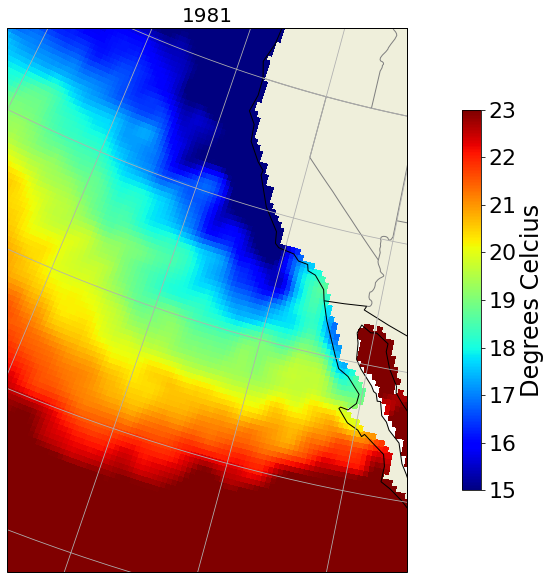

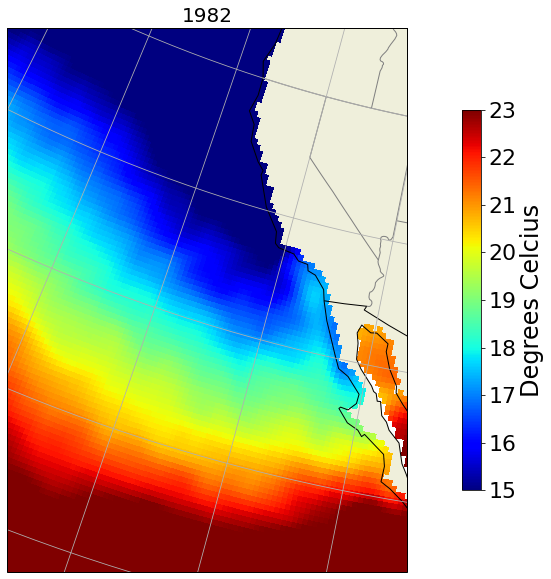

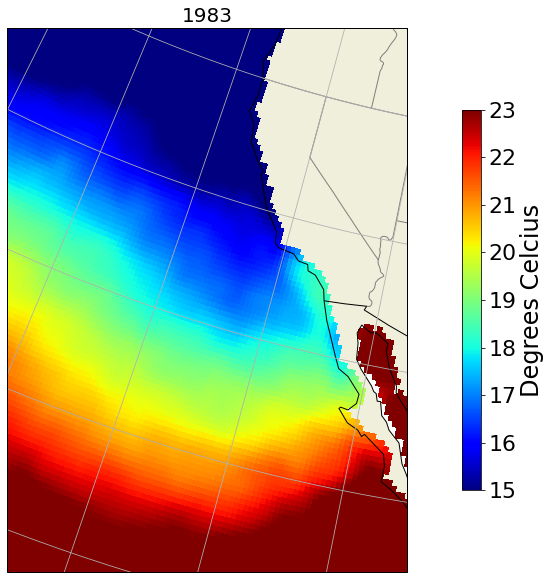

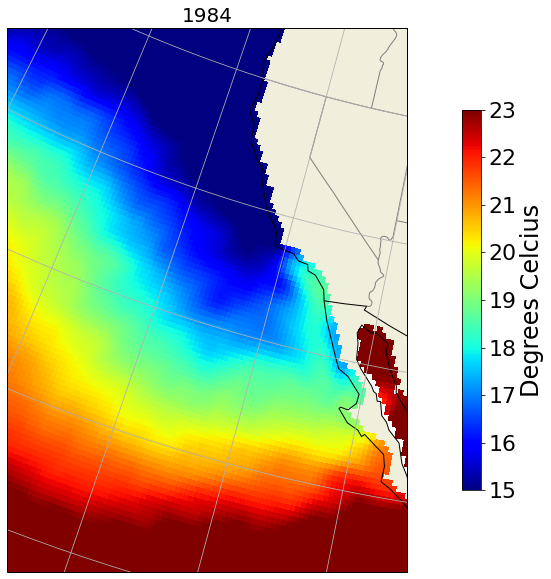

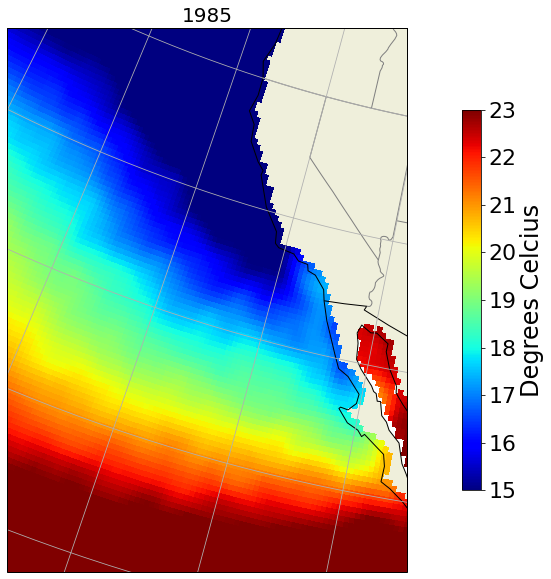

...

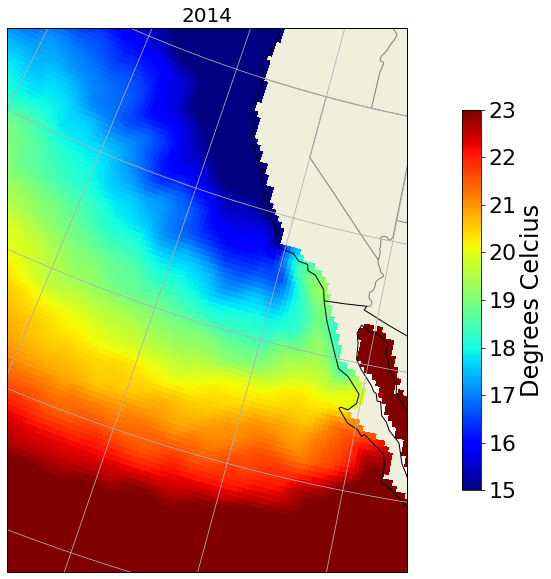

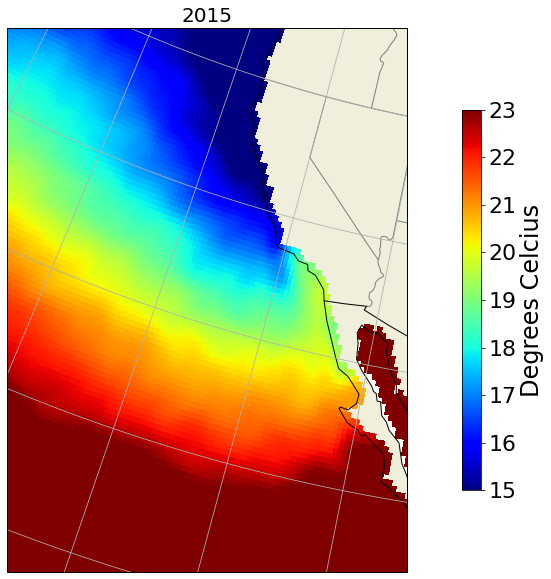

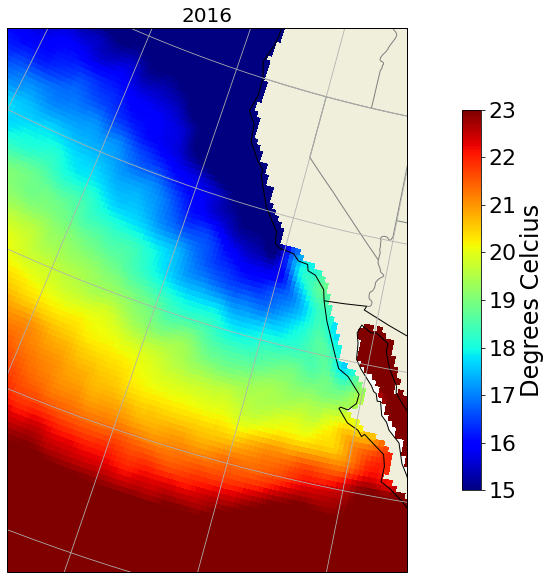

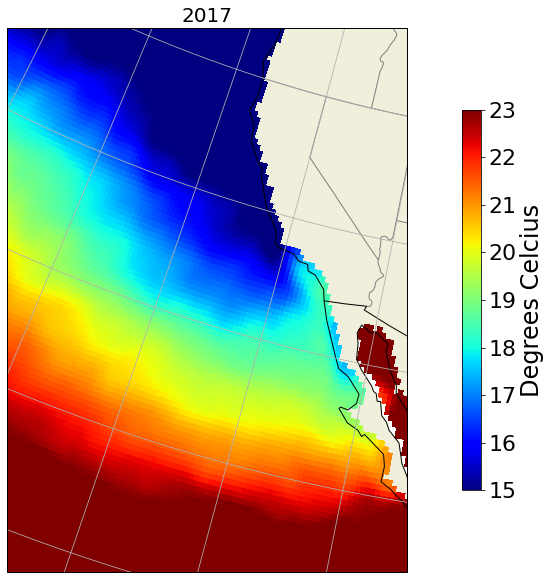

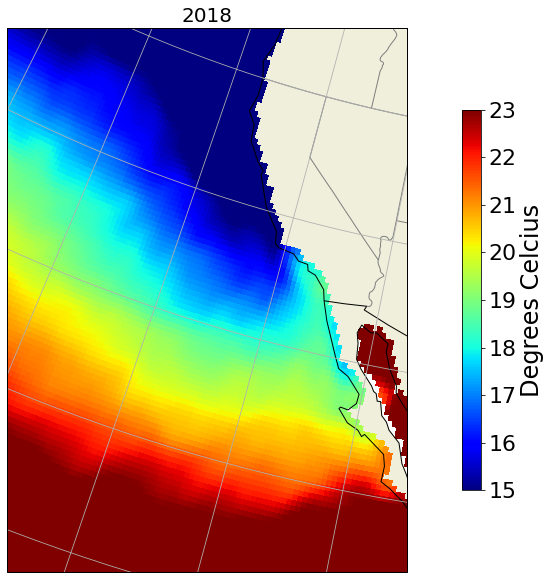

In [46]:
# Creating temperature maps
# Just for getting state lines 
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
#Only looking at NOAA for now
for curYear in range(1981, 2019):
    NOAA_years = np.where((pd.DatetimeIndex(NOAA.time.data).year==curYear))
    NOAA_short = NOAA.sst[(NOAA_years[0]),:,:]

    fig = plt.figure(figsize=[20,10])
    
    NOAA_Plot = fig.add_subplot(1,1,1,projection=crs.LambertConformal())
    NOAA_Plot.set_title(str(curYear), fontsize=20)
    NOAA_Plot.set_extent([230,245,20,43], crs.Geodetic())
    NOAA_Colormesh = NOAA_Plot.pcolormesh(lon, lat, NOAA_short.mean('time'),
                 transform=crs.PlateCarree(),
                 cmap='jet',vmax=max_Temp, vmin=min_Temp)
#     levels = MaxNLocator(nbins=15).tick_values(min_Temp, max_Temp)
#     NOAA_Colormesh = NOAA_Plot.contourf(lon, lat, NOAA_short.mean('time'),
#                      levels=levels, cmap='jet', transform=crs.PlateCarree(), vmin=min_Temp, vmax=max_Temp)
    NOAA_Plot.add_feature(cfeature.COASTLINE)
    NOAA_Plot.add_feature(cfeature.LAND)
    NOAA_Plot.add_feature(cfeature.BORDERS)
    NOAA_Plot.add_feature(states_provinces, edgecolor='gray')
    NOAA_Plot.gridlines()

    # Create a colorbar
    colorbar = fig.colorbar(NOAA_Colormesh, shrink=0.7, anchor=('SW'))
    colorbar.set_label('Degrees Celcius',fontsize=24)
    colorbar.ax.tick_params(labelsize=22)
    fig.savefig(r"D:\CRI_Modelling_PC\CRI Maps\HAB 2020\Interannual Variability GIFs\Temperature\ " + str(curYear)+ ".png", bbox_inches='tight')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in greater
  app.launch_new_instance()
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in greater
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in greater
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


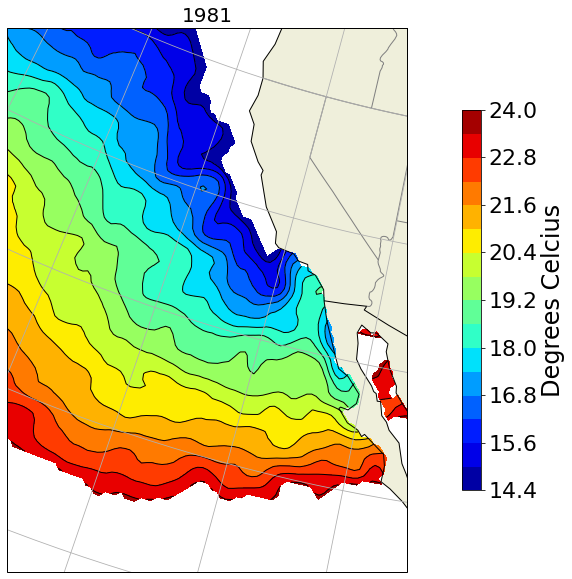

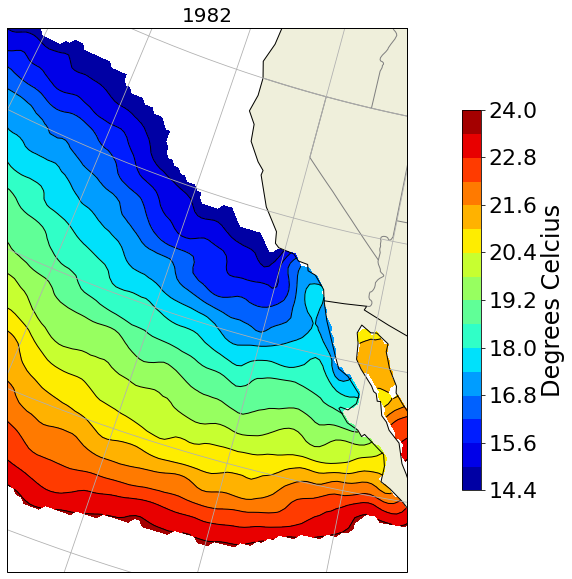

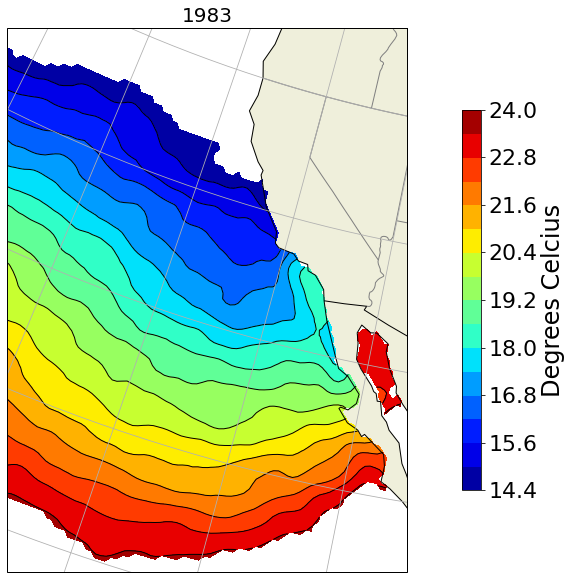

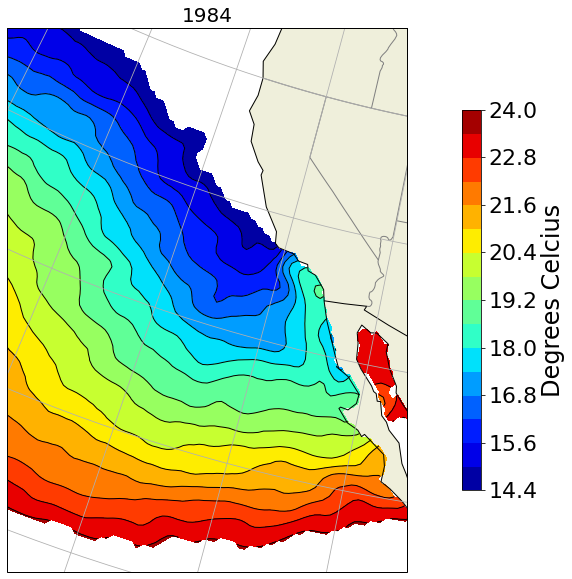

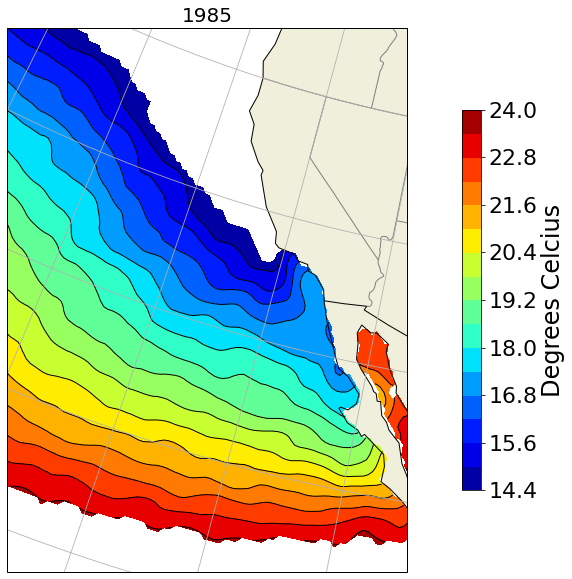

...

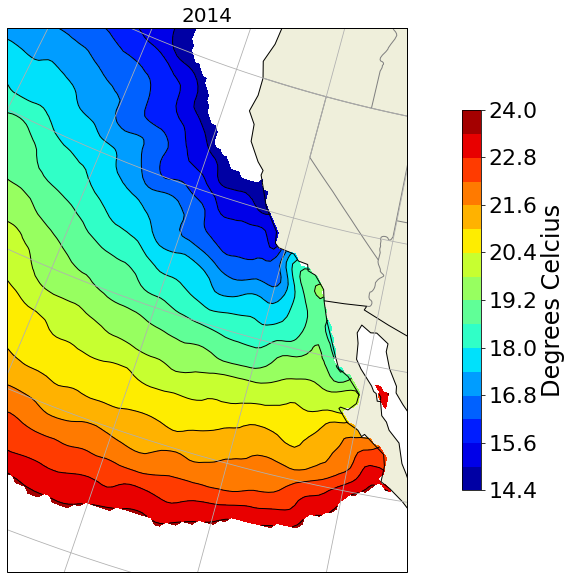

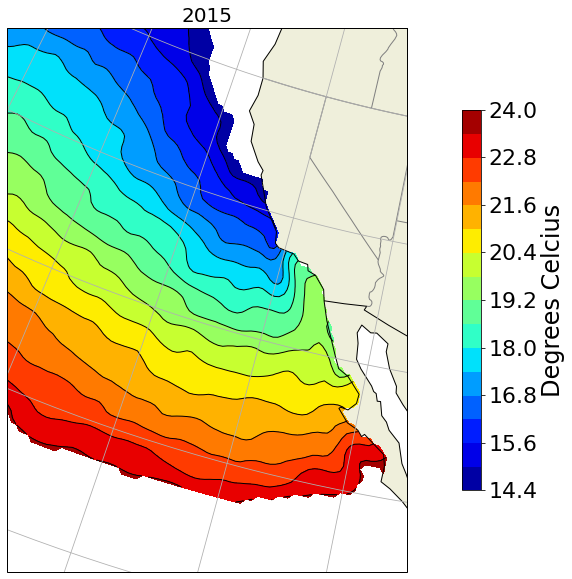

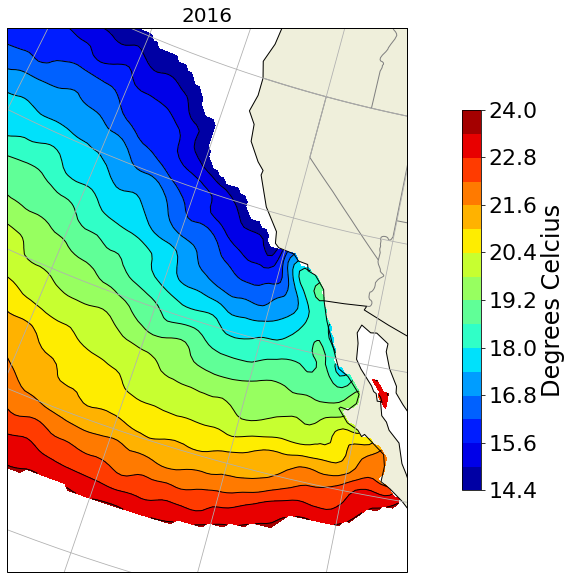

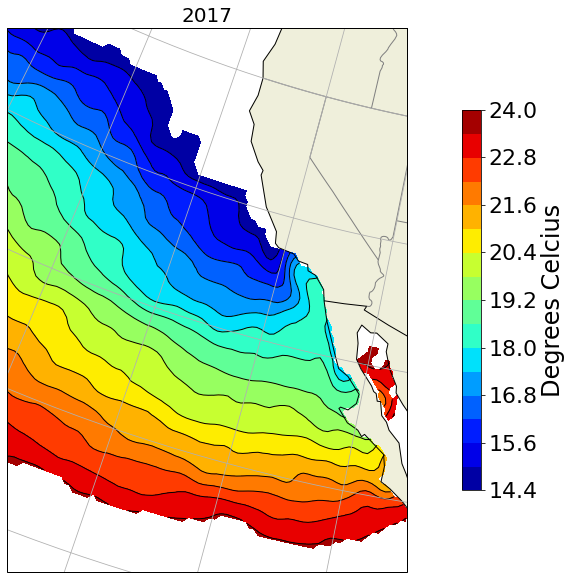

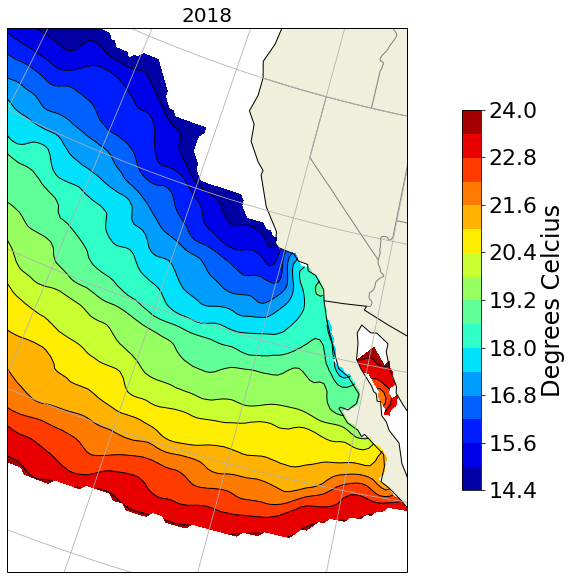

In [262]:
# Creating extremities maps
# Just for getting state lines 
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
#Only looking at NOAA for now
for curYear in range(1981, 2019):
    NOAA_years = np.where((pd.DatetimeIndex(NOAA.time.data).year==curYear))
    NOAA_short = NOAA.sst[(NOAA_years[0]),:,:]
    NOAA_temps = NOAA_short.mean('time')
    #NOAA_temps = NOAA_temps.where(NOAA_temps.isnull(), 1)
    for values in range(len(NOAA_temps.data)):
        for temp in range(len(NOAA_temps.data[values])):
            if (NOAA_temps.data[values][temp] > max_Temp - max_variance and NOAA_temps.data[values][temp] < max_Temp + max_variance): 
                continue
            elif(NOAA_temps.data[values][temp] > min_Temp - max_variance and NOAA_temps.data[values][temp] < min_Temp + max_variance):
                continue
            elif (NOAA_temps.data[values][temp] > min_Temp + max_variance and NOAA_temps.data[values][temp] < max_Temp - max_variance):
                continue
            else:
                #NOAA_temps.data[values][temp] = min_Temp + (max_Temp-min_Temp)/2
                NOAA_temps.data[values][temp] = None
    
    fig = plt.figure(figsize=[20,10])
    
    NOAA_Plot = fig.add_subplot(1,1,1,projection=crs.LambertConformal())
    NOAA_Plot.set_title(str(curYear), fontsize=20)
    NOAA_Plot.set_extent([230,245,20,43], crs.Geodetic())
#     NOAA_Colormesh = NOAA_Plot.pcolormesh(lon, lat, NOAA_temps.data,
#                  transform=crs.PlateCarree(),
#                  cmap='bwr',vmax=max_Temp, vmin=min_Temp)
    levels = MaxNLocator(nbins=15).tick_values(min_Temp-max_variance, max_Temp+max_variance)
    NOAA_Contour = NOAA_Plot.contourf(lon, lat, NOAA_temps.data,
                    levels = levels, cmap='jet', transform=crs.PlateCarree())
    NOAA_Plot.contour(lon, lat, NOAA_temps.data,
                      levels = levels, colors='black', transform=crs.PlateCarree(), linestyles="solid", linewidths=1)
#     NOAA_Plot.clabel(NOAA_Contour, inline=True, fontsize=12, colors='black', inline_spacing= 10)
    NOAA_Plot.add_feature(cfeature.COASTLINE)
    NOAA_Plot.add_feature(cfeature.LAND)
    NOAA_Plot.add_feature(cfeature.BORDERS)
    NOAA_Plot.add_feature(states_provinces, edgecolor='gray')
    NOAA_Plot.gridlines()

    # Create a colorbar
    colorbar = fig.colorbar(NOAA_Contour, shrink=0.7, anchor=('SW'))
    colorbar.set_label('Degrees Celcius',fontsize=24)
    colorbar.ax.tick_params(labelsize=22)
    fig.savefig(r"D:\CRI_Modelling_PC\CRI Maps\HAB 2020\Interannual Variability GIFs\Extremities\ " + str(curYear)+ ".png", bbox_inches='tight')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in greater
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in greater
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in greater


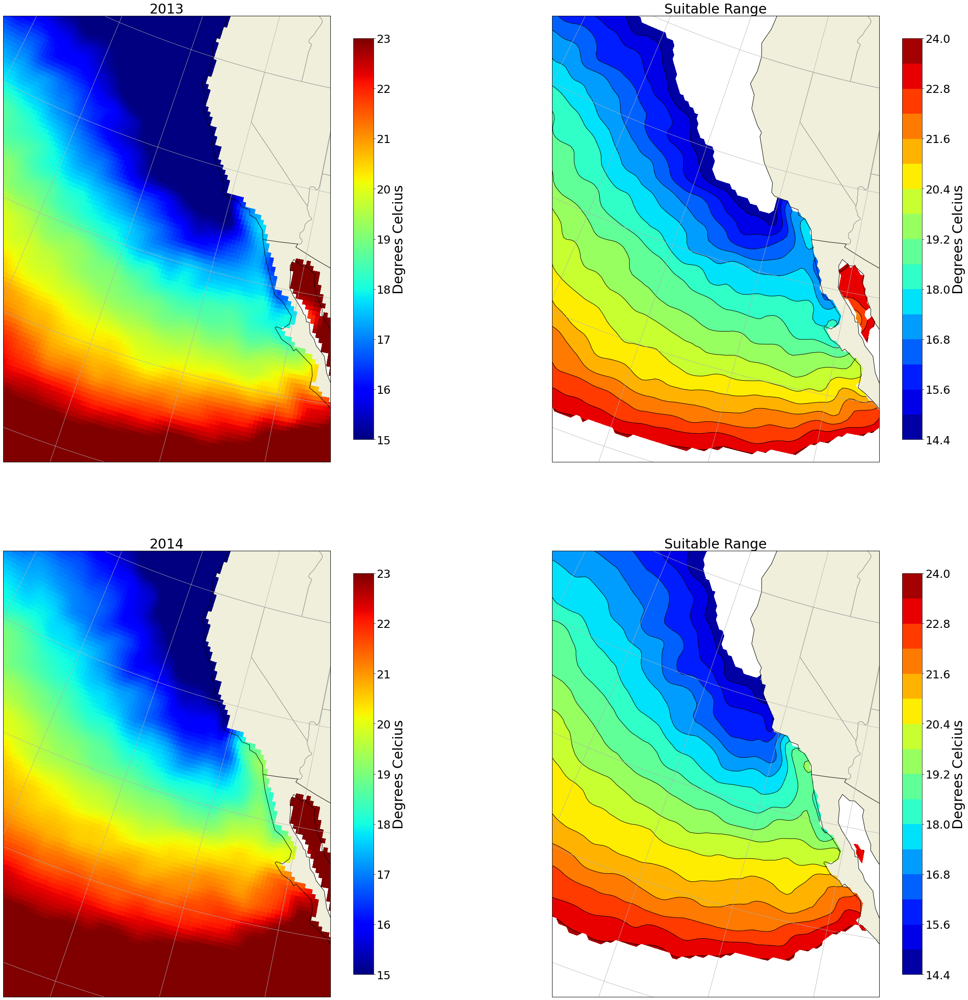

In [267]:
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
mapOrder = 1
fig = plt.figure(figsize=[40,40])
for curYear in [2013, 2014]:
    NOAA_years = np.where((pd.DatetimeIndex(NOAA.time.data).year==curYear))
    NOAA_short = NOAA.sst[(NOAA_years[0]),:,:]
    NOAA_temps = NOAA_short.mean('time')

    
    NOAA_Plot = fig.add_subplot(2,2,mapOrder,projection=crs.LambertConformal())
    mapOrder+=1
    NOAA_Plot.set_title(str(curYear), fontsize=30)
    NOAA_Plot.set_extent([230,245,20,43], crs.Geodetic())
#     NOAA_Masked = np.ma.masked_where((finalBath < -2) & (finalBath > -100), NOAA_short.mean('time'))
    NOAA_Colormesh = NOAA_Plot.pcolormesh(lon, lat, NOAA_short.mean('time'),
                 transform=crs.PlateCarree(),
                 cmap='jet',vmax=max_Temp, vmin=min_Temp)
#     NOAA_Colormesh = NOAA_Plot.pcolormesh(lon, lat, NOAA_Masked,
#                    transform=crs.PlateCarree(),
#                    cmap='jet',vmax=max_Temp, vmin=min_Temp)
    NOAA_Plot.add_feature(cfeature.COASTLINE)
    NOAA_Plot.add_feature(cfeature.LAND)
    NOAA_Plot.add_feature(cfeature.BORDERS)
    NOAA_Plot.add_feature(states_provinces, edgecolor='gray')
    NOAA_Plot.gridlines()

    # Create a colorbar
    colorbar = fig.colorbar(NOAA_Colormesh, shrink=0.9, anchor=('SW'))
    colorbar.set_label('Degrees Celcius',fontsize=30)
    colorbar.ax.tick_params(labelsize=25)
    
    for values in range(len(NOAA_temps.data)):
        for temp in range(len(NOAA_temps.data[values])):
            if (NOAA_temps.data[values][temp] > max_Temp - max_variance and NOAA_temps.data[values][temp] < max_Temp + max_variance): 
                continue
            elif(NOAA_temps.data[values][temp] > min_Temp - max_variance and NOAA_temps.data[values][temp] < min_Temp + max_variance):
                continue
            elif (NOAA_temps.data[values][temp] > min_Temp + max_variance and NOAA_temps.data[values][temp] < max_Temp - max_variance):
                continue
            else:
                NOAA_temps.data[values][temp] = None
                
    NOAA_Plot = fig.add_subplot(2,2,mapOrder,projection=crs.LambertConformal())
    mapOrder+=1
    NOAA_Plot.set_title("Suitable Range", fontsize=30)
    NOAA_Plot.set_extent([230,245,20,43], crs.Geodetic())

    levels = MaxNLocator(nbins=15).tick_values(min_Temp-max_variance, max_Temp+max_variance)
    NOAA_Contour = NOAA_Plot.contourf(lon, lat, NOAA_temps.data,
                    levels = levels, cmap='jet', transform=crs.PlateCarree())
    NOAA_Plot.contour(lon, lat, NOAA_temps.data,
                      levels = levels, colors='black', transform=crs.PlateCarree(), linestyles="solid", linewidths=1)
    NOAA_Plot.add_feature(cfeature.COASTLINE)
    NOAA_Plot.add_feature(cfeature.LAND)
    NOAA_Plot.add_feature(cfeature.BORDERS)
    NOAA_Plot.add_feature(states_provinces, edgecolor='gray')
    NOAA_Plot.gridlines()

    # Create a colorbar
    colorbar = fig.colorbar(NOAA_Contour, shrink=0.9, anchor=('SW'))
    colorbar.set_label('Degrees Celcius',fontsize=30)
    colorbar.ax.tick_params(labelsize=25)

    
fig.savefig(r"D:\CRI_Modelling_PC\CRI Maps\HAB 2020\Interannual Variability GIFs\2013vs2014.png", bbox_inches='tight')


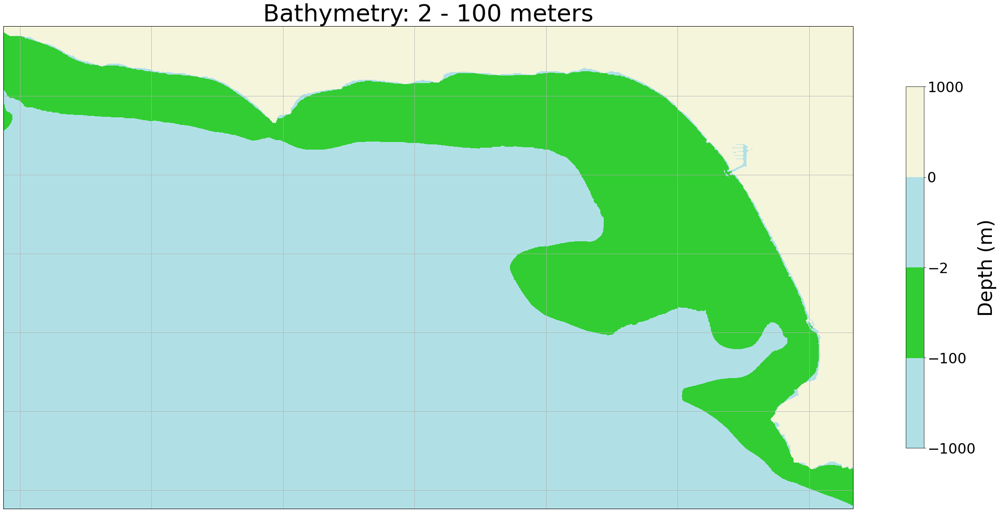

In [232]:
# finalBath = np.resize(finalBath, NOAA_short[0,:,:].size)
# finalBath = np.reshape(finalBath, NOAA_short[0,:,:].shape)
finalBath = bathymetry.Band1
fig = plt.figure(figsize=[40,20])

plotBath = fig.add_subplot(1,1,1,projection=crs.PlateCarree())
plotBath.set_title('Bathymetry: 2 - 100 meters',fontsize=50)

levels = [-1000,-100,-2,0,1000]

c = ('powderblue', 'limegreen', 'powderblue','beige')

plot = plotBath.contourf(bathLon, bathLat, finalBath, levels,
             transform=crs.PlateCarree(), colors=c)

plotBath.gridlines()

colorbar = fig.colorbar(plot, shrink=0.7, anchor=('SW'))
colorbar.set_label('Depth (m)',fontsize=40)
colorbar.ax.tick_params(labelsize=30)
bathMask = finalBath.where((finalBath < -2) & (finalBath > -100))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in greater
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in greater
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


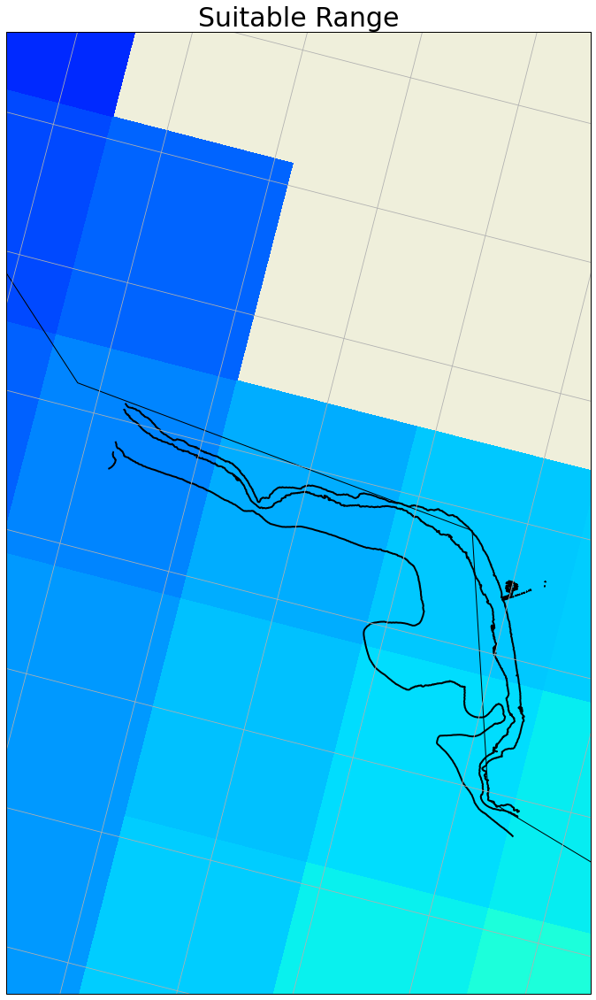

In [264]:
# ##MASKING BATH\
# states_provinces = cfeature.NaturalEarthFeature(
#         category='cultural',
#         name='admin_1_states_provinces_lines',
#         scale='50m',
#         facecolor='none')

# fig = plt.figure(figsize=[20,20])

# NOAA_years = np.where((pd.DatetimeIndex(NOAA.time.data).year==1981))
# NOAA_short = NOAA.sst[(NOAA_years[0]),:,:]
# NOAA_temps = NOAA_short.mean('time')

    
# for values in range(len(NOAA_temps.data)):
#     for temp in range(len(NOAA_temps.data[values])):
#         if (NOAA_temps.data[values][temp] > max_Temp - max_variance and NOAA_temps.data[values][temp] < max_Temp + max_variance): 
#             continue
#         elif(NOAA_temps.data[values][temp] > min_Temp - max_variance and NOAA_temps.data[values][temp] < min_Temp + max_variance):
#             continue
#         elif (NOAA_temps.data[values][temp] > min_Temp + max_variance and NOAA_temps.data[values][temp] < max_Temp - max_variance):
#             continue
#         else:
#             NOAA_temps.data[values][temp] = None
                
# NOAA_Plot = fig.add_subplot(1,1,1,projection=crs.LambertConformal())
# NOAA_Plot.set_title("Suitable Range", fontsize=30)
# #NOAA_Plot.set_extent([230,245,20,43], crs.Geodetic())
# #NOAA_Plot.set_extent([-116, -120, 33, 33], crs.Geodetic())
# NOAA_Plot.set_extent([-118.5, -119, 33.5, 34.5], crs.Geodetic())

# levels = MaxNLocator(nbins=15).tick_values(min_Temp-max_variance, max_Temp+max_variance)
# bathLevels = [-1000,-100,-20,0,1000]
# #c = ('powderblue', 'black', 'powderblue','beige')

# # NOAA_Contour = NOAA_Plot.contourf(lon, lat, NOAA_temps.data, 
# #                                   levels = levels, cmap='jet', transform=crs.PlateCarree())
# NOAA_Colormesh = NOAA_Plot.pcolormesh(lon, lat, NOAA_short.mean('time'),
#                  transform=crs.PlateCarree(),
#                  cmap='jet',vmax=max_Temp, vmin=min_Temp)
# # NOAA_Plot.contour(lon, lat, NOAA_temps.data, levels = levels, 
# #                   colors='black', transform=crs.PlateCarree(), linestyles="solid", linewidths=1)
# NOAA_Plot.contour(bathLon, bathLat, finalBath, bathLevels,
#              transform=crs.PlateCarree(), colors='black', linewidths=2, linestyles="solid")


# NOAA_Plot.add_feature(cfeature.COASTLINE)
# NOAA_Plot.add_feature(cfeature.LAND)
# NOAA_Plot.add_feature(cfeature.BORDERS)
# NOAA_Plot.add_feature(states_provinces, edgecolor='gray')
# NOAA_Plot.gridlines()